In [38]:
from regress_adapter import get_news_date

data = get_news_date('2022-01-01')
print(data.head())

/Users/ngocp/Documents/projects/pyml/botapp/algorithm/regress_adapter.py:28: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql(query, connection)


                                               title  \
0  Góc nhìn chuyên gia: Khả năng thị trường còn đ...   
1  Vì sao vợ chồng tổng giám đốc CII muốn bán sạc...   
2  Chứng khoán giảm 4 tuần liên tục, nhà đầu tư l...   
3  Khải Hoàn Land (KHG) muốn chào bán riêng lẻ 18...   
4  Đất Xanh Services (DXS) chốt ngày phát hành 12...   

                                             content                date  
0  \n\n\n\n\nTIN MỚI\n\n\n\n\n    Thị trường chứn... 2023-08-10 12:58:00  
1  \n\n\n\n\r\n                    CII: \n\n\n\n\... 2023-09-10 09:35:00  
2  \n\n\n\n\nTIN MỚI\n\n\n\n\n\nKhông phục hồi nh... 2023-07-10 19:01:00  
3  \n\n\n\n\r\n                    KHG: \n\n\n\n\... 2023-06-10 10:20:00  
4  \n\n\n\n\r\n                    DXS: \n\n\n\n\... 2023-05-10 01:00:00  


In [39]:
t = data['title'] + data['content']
data_list = t.to_list()

In [52]:
import re
import helper
import numpy as np
from importlib import reload
from underthesea import word_tokenize

reload(helper)

def segmentation(text):
    try:
        return word_tokenize(text, format="text")
    except (TypeError, AttributeError):
        return ''

def split_words(post, return_type='sentence'):
    texts = segmentation(post)
    try:
        t = [str(x.strip('0123456789%@$.,=+-!;/()*"&^:#|\n\t\' ').lower()) for x in texts.split()]
        filtered_list = [item for item in t if item.strip() != ""]
        if return_type == 'token':
            return filtered_list
        elif return_type == 'sentence':
            return ' '.join(filtered_list)

    except TypeError:
        return []
    
def split_tokens(post):
    return split_words(post, return_type='token')

In [65]:
# remove empty doc in data_list
data_list = [str(x) for x in data_list if type(x) == str and x.strip() != '']

In [60]:
t = split_tokens(data_list[0])
print(t)

['góc', 'nhìn', 'chuyên_gia', 'khả_năng', 'thị_trường', 'còn', 'điều_chỉnh', 'tận_dụng', 'cơ_hội', 'gom', 'một_số', 'nhóm', 'cổ_phiếu', 'đón', 'sóng', 'quý', 'tin', 'mới_thị_trường', 'chứng_khoán', 'đóng', 'cửa', 'tuần', 'thứ', 'liên_tiếp', 'giảm', 'điểm', 'với', 'thanh', 'khoản', 'suy_yếu', 'mặc_dù', 'lực', 'cầu', 'le_lói', 'xuất_hiện', 'giúp', 'chỉ_số', 'bật', 'tăng', 'gần', 'điểm', 'lên', 'điểm', 'trong', 'phiên', 'cuối', 'tuần', 'song', 'tính', 'chung', 'cả', 'tuần', 'vn-index', 'vẫn', 'mất', 'gần', 'điểm', 'nếu', 'so', 'với', 'đỉnh', 'ngắn_hạn', 'thị_trường', 'đã', 'giảm', 'điểm', 'tương_đương', 'khoảng', 'đa_số', 'các', 'chuyên_gia', 'đều', 'đồng', 'thuận', 'những', 'tín_hiệu', 'tạo', 'đáy', 'vẫn', 'chưa', 'rõ_ràng', 'và', 'khả_năng', 'vn-index', 'vẫn', 'cần', 'nhịp', 'điều_chỉnh', 'tích_luỹ', 'để', 'tiếp_tục', 'đi', 'lên', 'trong', 'trung', 'và', 'dài_hạn', 'tâm_điểm', 'thị_trường', 'thời_gian', 'tới', 'sẽ', 'xoay', 'quanh', 'bức', 'tranh', 'kqkd', 'quý', 'và', 'nhà_đầu_tư', 'có

In [61]:
from top2vec import Top2Vec
# X_2 = [words for words in map(split_words, data_list) if len(words) > 0]
# X_2 = list(map(split_words, data_list))
print(type(data_list), len(data_list))


<class 'list'>


In [66]:
model = Top2Vec(documents=data_list, embedding_model="distiluse-base-multilingual-cased", speed = "learn", tokenizer=split_tokens)

2023-10-30 07:28:53,432 - top2vec - INFO - Pre-processing documents for training
/Users/ngocp/.pyenv/versions/3.10.3/lib/python3.10/site-packages/sklearn/feature_extraction/text.py:528: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(
2023-10-30 07:31:29,004 - top2vec - INFO - Downloading distiluse-base-multilingual-cased model
2023-10-30 07:31:30,856 - top2vec - INFO - Creating joint document/word embedding
2023-10-30 07:32:49,307 - top2vec - INFO - Creating lower dimension embedding of documents
2023-10-30 07:32:56,602 - top2vec - INFO - Finding dense areas of documents
2023-10-30 07:32:56,653 - top2vec - INFO - Finding topics


In [ ]:
# write code save model to file
model.save('./cached/top2vec.model')

In [67]:
num_topic = model.get_num_topics()
print(num_topic)


22


In [68]:
topic_sizes, topic_nums = model.get_topic_sizes()
print(topic_sizes, topic_nums)

[558 303 296 213 178 129 127 126 117 106 104 102  95  91  74  70  64  47
  42  38  36  22] [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]


/Users/ngocp/.pyenv/versions/3.10.3/lib/python3.10/site-packages/top2vec/Top2Vec.py:2732: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16, 4),


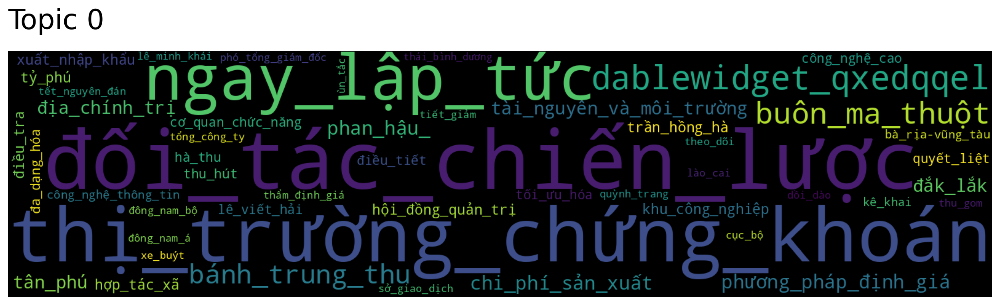

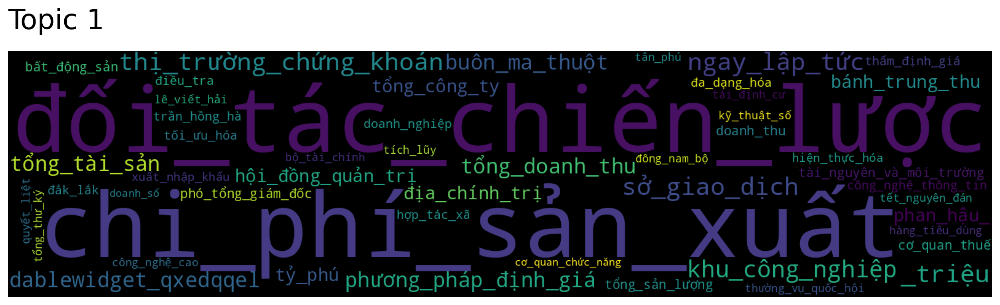

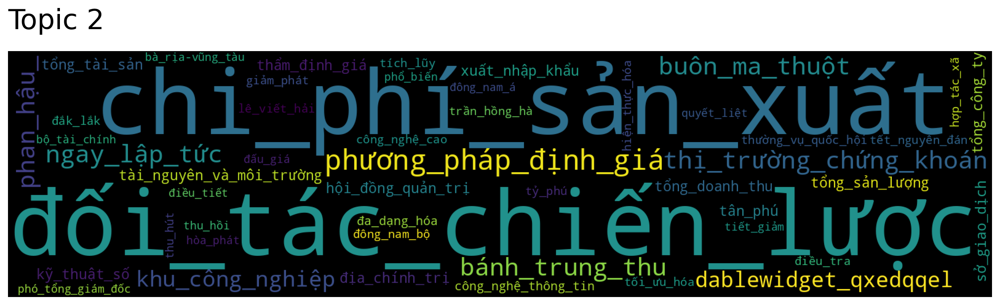

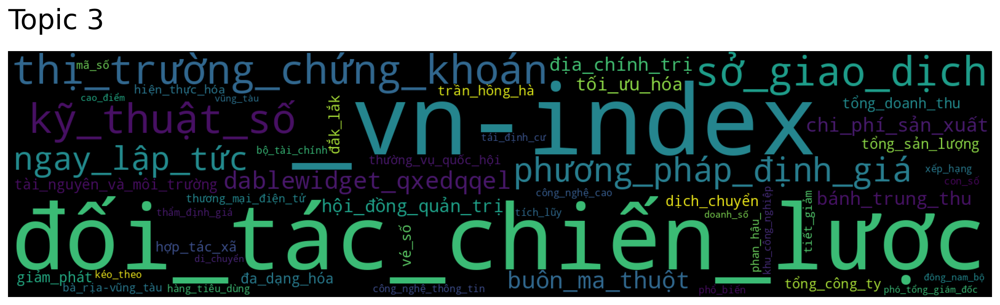

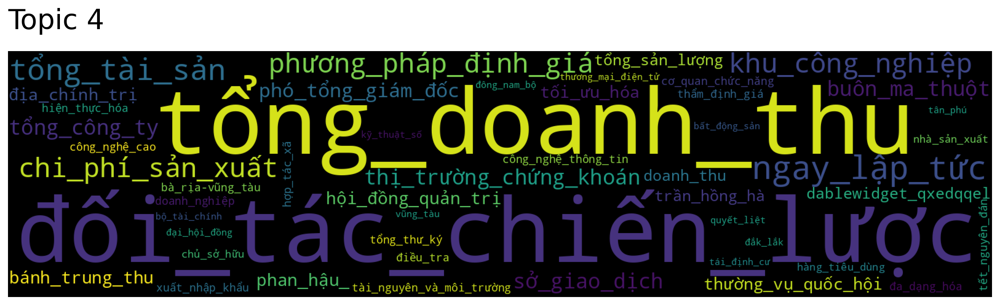

...

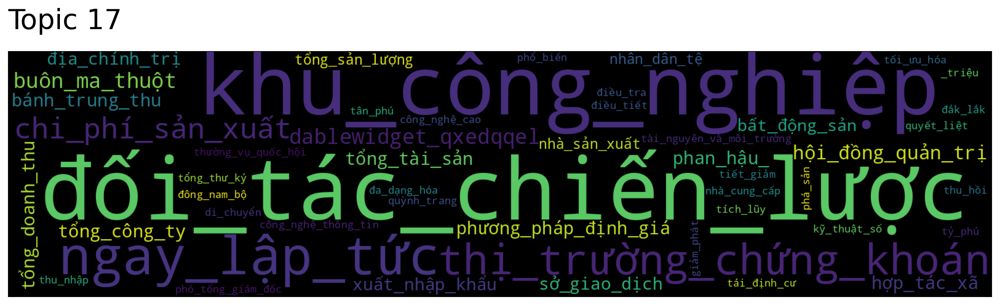

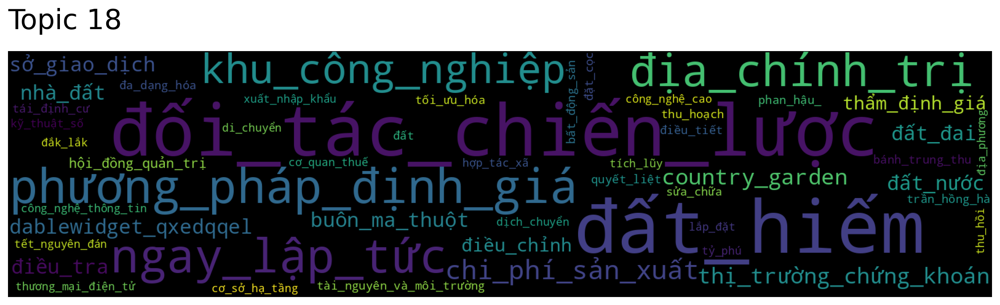

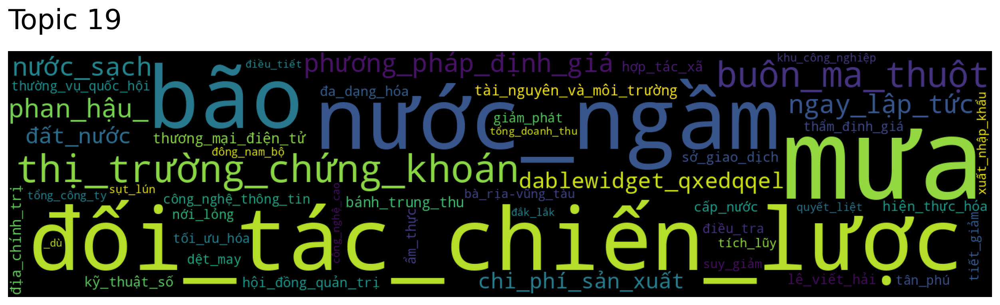

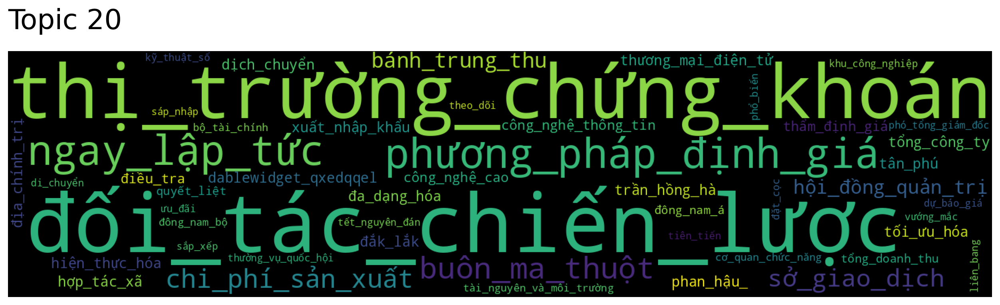

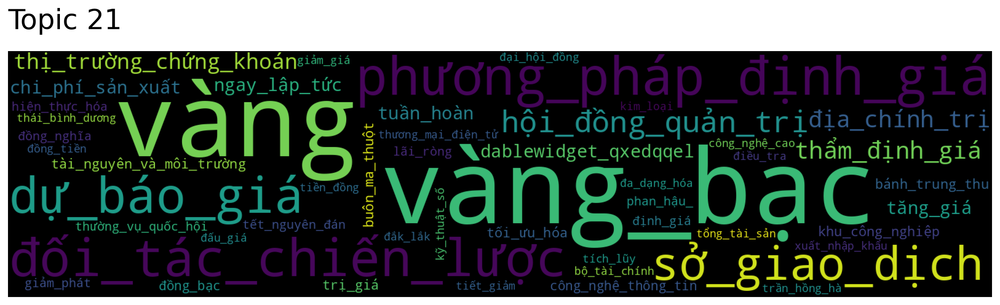

In [70]:
# topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["chứng_khoán"], num_topics=5)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

In [71]:
print(model.doc_top)
print(len(model.doc_top))

[3 1 3 ... 0 1 1]
2938


In [72]:
import matplotlib.pyplot as plt
import umap

umap_args = {
    "n_neighbors": 15,
    "n_components": 2,
    "metric": "cosine",
}
umap_model = umap.UMAP(**umap_args).fit(model.document_vectors)


In [76]:
print(model.document_vectors.shape, model.document_vectors[0])

(2938, 512) [ 6.53472692e-02 -9.79835982e-04  3.64851989e-02 -5.31110279e-02
  3.81129421e-02 -2.23723873e-02  9.93381441e-03  6.12470806e-02
  6.31969944e-02  9.14132819e-02  3.02110263e-03  2.52390653e-02
  6.86113387e-02  3.12030986e-02 -3.54771316e-02  5.04918471e-02
  2.02338658e-02 -3.98891158e-02 -4.98661660e-02 -6.94645047e-02
 -2.55489890e-02  2.17379760e-02  4.26583476e-02  4.52700034e-02
 -4.51167934e-02 -2.81506889e-02 -3.12385485e-02 -2.90823169e-02
  9.92094819e-03 -1.96650010e-02 -2.95852683e-02  3.85001884e-03
  1.65405180e-02 -4.85289916e-02  3.53560746e-02  1.14253853e-02
 -1.79462433e-02 -1.73598863e-02 -4.57139798e-02  1.02949813e-01
 -9.88570787e-03  1.25034377e-02  3.52293439e-03  8.70237276e-02
 -3.30001526e-02 -8.38235244e-02  3.63252126e-02  1.10207967e-01
  2.72042938e-02  4.81803156e-02 -5.89975417e-02 -1.19361384e-02
 -1.06954353e-03  1.96522102e-03  6.87217787e-02 -1.02855548e-01
 -8.03993493e-02 -5.17145395e-02 -1.00602526e-02 -4.82261740e-02
 -3.03570018e

In [74]:
print(umap_model.embedding_.shape)
print(umap_model.embedding_[:2])

(2938, 2)
[[13.991771  8.268298]
 [10.692831  9.456043]]


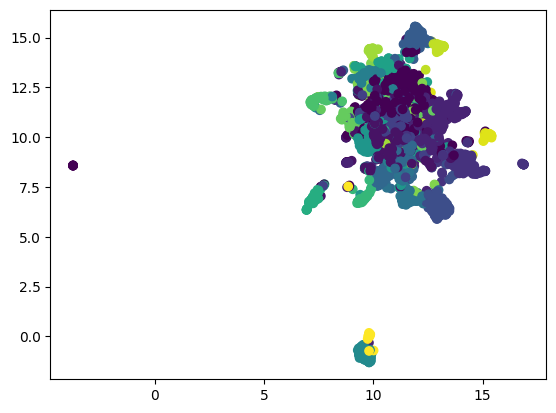

In [75]:

# Create a scatter plot of the UMAP embeddings
plt.scatter(umap_model.embedding_[:, 0], umap_model.embedding_[:, 1], c=model.doc_top)
plt.show()

In [81]:
# Get the document vectors for the first topic
topic_docs = model.get_documents_topics([1, 2])

# Print the document vectors
print(topic_docs)

(array([1, 3]), array([0.81570894, 0.8508843 ], dtype=float32), array([['đối_tác_chiến_lược', 'chi_phí_sản_xuất',
        'thị_trường_chứng_khoán', '_triệu', 'sở_giao_dịch',
        'ngay_lập_tức', 'khu_công_nghiệp', 'phương_pháp_định_giá',
        'buôn_ma_thuột', 'tổng_tài_sản', 'tổng_doanh_thu',
        'dablewidget_qxedqqel', 'hội_đồng_quản_trị', 'bánh_trung_thu',
        'tỷ_phú', 'phan_hậu_', 'tổng_công_ty', 'địa_chính_trị',
        'tài_nguyên_và_môi_trường', 'tổng_sản_lượng', 'bất_động_sản',
        'cơ_quan_thuế', 'phó_tổng_giám_đốc', 'doanh_thu',
        'công_nghệ_thông_tin', 'thẩm_định_giá', 'hợp_tác_xã',
        'doanh_nghiệp', 'đắk_lắk', 'đa_dạng_hóa', 'tối_ưu_hóa',
        'điều_tra', 'trần_hồng_hà', 'xuất_nhập_khẩu', 'hiện_thực_hóa',
        'thường_vụ_quốc_hội', 'lê_viết_hải', 'công_nghệ_cao',
        'kỹ_thuật_số', 'tân_phú', 'tích_lũy', 'quyết_liệt',
        'tết_nguyên_đán', 'đông_nam_bộ', 'bộ_tài_chính', 'tổng_thư_ký',
        'tái_định_cư', 'hàng_tiêu_dùng', 'cơ_q

In [83]:
words, word_scores = model.similar_words(keywords=["thị_trường_chứng_khoán"], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

công_nghệ_cao 0.9512867643423211
công_nghệ_thông_tin 0.9327505468131659
địa_chính_trị 0.9259997751552672
chi_phí_sản_xuất 0.923989584803162
chứng_khoán 0.9193725481037482
đối_tác_chiến_lược 0.914307645346024
đông_nam_bộ 0.913444875813826
lê_viết_hải 0.9127547679595298
cao_cấp 0.9104970202439191
nhà_sản_xuất 0.9093215102455541
nhà_cung_cấp 0.9060512837998046
xuất_nhập_khẩu 0.9047204448784759
quyết_liệt 0.9028057724432321
tết_nguyên_đán 0.9025321336703122
nội_địa 0.9025174209626514
bộ_tài_chính 0.9017635422710089
xúc_tiến 0.9009829546849452
mục_đích 0.9008686457946701
khu_công_nghiệp 0.900627422268326
thiết_lập 0.8998758938792338
